In [78]:
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image
from qutip import (Qobj, about, basis, coherent, coherent_dm, create, destroy,
                   expect, fock, fock_dm, mesolve, qeye, sigmax, sigmay,
                   sigmaz, tensor, thermal_dm, anim_matrix_histogram,
                   anim_fock_distribution)
# set a parameter to see animations in line
from matplotlib import rc
rc('animation', html='jshtml')

%matplotlib inline

In [79]:
q = Qobj([[1], [0]])
q

Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[1.]
 [0.]]

In [80]:
q.dims
q.shape

(2, 1)

In [81]:
q.isherm, q.type

(False, 'ket')

In [82]:
sx = Qobj([[0,-1j],[1j,0]])
sx

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[ 0.+0.j -0.-1.j]
 [ 0.+1.j  0.+0.j]]

In [83]:
sx.isherm

True

In [84]:
sz = Qobj([[1,0],[0,1]])
sz

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[1. 0.]
 [0. 1.]]

In [85]:
H = sx+sz
H

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[1.+0.j 0.-1.j]
 [0.+1.j 1.+0.j]]

In [86]:
H.dag()

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=Dense, isherm=True
Qobj data =
[[1.+0.j 0.-1.j]
 [0.+1.j 1.+0.j]]

In [87]:
H.tr()

2.0

In [88]:
H.eigenenergies()

array([0., 2.])

States and operators

In [89]:
N = 2
n = 1
basis(N,n)  #Equivalente a fock(N,n)

Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[0.]
 [1.]]

In [90]:
fock(4,2)

Quantum object: dims=[[4], [1]], shape=(4, 1), type='ket', dtype=Dense
Qobj data =
[[0.]
 [0.]
 [1.]
 [0.]]

In [91]:
coherent(N=10, alpha=1.0) #Estado coherente autovalor 1

Quantum object: dims=[[10], [1]], shape=(10, 1), type='ket', dtype=Dense
Qobj data =
[[0.60653066]
 [0.60653066]
 [0.42888194]
 [0.24761511]
 [0.12380753]
 [0.0553686 ]
 [0.02260303]
 [0.00854887]
 [0.00299672]
 [0.00110007]]

Density matrices

In [92]:
fock_dm(5, 2)  # 5 = hilbert space size, 2 = state that is occupied

Quantum object: dims=[[5], [5]], shape=(5, 5), type='oper', dtype=Dia, isherm=True
Qobj data =
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]

In [93]:
# coherent state as density matrix
coherent_dm(N=8, alpha=1.0)

Quantum object: dims=[[8], [8]], shape=(8, 8), type='oper', dtype=Dense, isherm=True
Qobj data =
[[3.67879439e-01 3.67879455e-01 2.60129900e-01 1.50187300e-01
  7.50858773e-02 3.36199110e-02 1.35485515e-02 5.77267786e-03]
 [3.67879455e-01 3.67879470e-01 2.60129911e-01 1.50187306e-01
  7.50858804e-02 3.36199124e-02 1.35485520e-02 5.77267810e-03]
 [2.60129900e-01 2.60129911e-01 1.83939513e-01 1.06198399e-01
  5.30937031e-02 2.37728537e-02 9.58026722e-03 4.08189737e-03]
 [1.50187300e-01 1.50187306e-01 1.06198399e-01 6.13141770e-02
  3.06539153e-02 1.37253761e-02 5.53121524e-03 2.35670388e-03]
 [7.50858773e-02 7.50858804e-02 5.30937031e-02 3.06539153e-02
  1.53253712e-02 6.86197771e-03 2.76532136e-03 1.17822997e-03]
 [3.36199110e-02 3.36199124e-02 2.37728537e-02 1.37253761e-02
  6.86197771e-03 3.07246966e-03 1.23818035e-03 5.27555757e-04]
 [1.35485515e-02 1.35485520e-02 9.58026722e-03 5.53121524e-03
  2.76532136e-03 1.23818035e-03 4.98976640e-04 2.12600691e-04]
 [5.77267786e-03 5.77267810e

Operator

In [94]:
display(sigmax(),sigmay(),sigmaz())

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0. 1.]
 [1. 0.]]

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0.+0.j 0.-1.j]
 [0.+1.j 0.+0.j]]

Quantum object: dims=[[2], [2]], shape=(2, 2), type='oper', dtype=CSR, isherm=True
Qobj data =
[[ 1.  0.]
 [ 0. -1.]]

In [95]:
a = destroy(N=8)
x = a + a.dag()
x

Quantum object: dims=[[8], [8]], shape=(8, 8), type='oper', dtype=Dia, isherm=True
Qobj data =
[[0.         1.         0.         0.         0.         0.
  0.         0.        ]
 [1.         0.         1.41421356 0.         0.         0.
  0.         0.        ]
 [0.         1.41421356 0.         1.73205081 0.         0.
  0.         0.        ]
 [0.         0.         1.73205081 0.         2.         0.
  0.         0.        ]
 [0.         0.         0.         2.         0.         2.23606798
  0.         0.        ]
 [0.         0.         0.         0.         2.23606798 0.
  2.44948974 0.        ]
 [0.         0.         0.         0.         0.         2.44948974
  0.         2.64575131]
 [0.         0.         0.         0.         0.         0.
  2.64575131 0.        ]]

In [96]:
def commutator(op1,op2):
    return op1*op2-op2*op1

In [97]:
commutator(a,a.dag())

Quantum object: dims=[[8], [8]], shape=(8, 8), type='oper', dtype=Dia, isherm=True
Qobj data =
[[ 1.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  1.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  1.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  1.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  1.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  1.  0.]
 [ 0.  0.  0.  0.  0.  0.  0. -7.]]

In [98]:
sigmax()**2==sigmay()**2==sigmaz()**2 == qeye(2)

True

Composite systems

In [99]:
sz1 = tensor(sigmaz(),qeye(2))
sz1

Quantum object: dims=[[2, 2], [2, 2]], shape=(4, 4), type='oper', dtype=CSR, isherm=True
Qobj data =
[[ 1.  0.  0.  0.]
 [ 0.  1.  0.  0.]
 [ 0.  0. -1.  0.]
 [ 0.  0.  0. -1.]]

In [100]:
psi1 = tensor(basis(N,1),basis(N,0))
psi2 = tensor(basis(N,0),basis(N,1))

In [101]:
sz1*psi1 == psi1

False

In [102]:
sz1*psi2 == psi2

True

Esto es útil si estoy trabajando en un espacio de Hilbert que es el producto tensorial de otros dos. Puedo representar matrices como $$H_0 =S_x^{e-}S_x^{e+}$$ y mucho más

In [103]:
Ho = tensor(sigmax(),sigmax())
Ho

Quantum object: dims=[[2, 2], [2, 2]], shape=(4, 4), type='oper', dtype=CSR, isherm=True
Qobj data =
[[0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]]

Unitary dynamics. Usa un comando para calcular evoluciones temporales

Por ejemplo, tengo $$H = \sigma _x$$ y estoy en el estado |+>, espín +1/2 de $\sigma _z$

In [104]:
H = sigmax()
psi0 = basis(2,0) #Aquí un poco lío, la base tiene dimensión 2, pero el 0 es el primer estado, cosas de python
tlist = np.linspace(0,10,100)

result = mesolve(H,psi0,tlist,[],[])

c:\Users\lande\AppData\Local\Programs\Python\Python312\Lib\site-packages\qutip\solver\solver_base.py:576: FutureWarning: e_ops will be keyword only from qutip 5.3 for all solver
  warnings.warn(


In [105]:
result #si quiere ver cuáles son los estados, tengo que hacer result.states, es un array.

<Result
  Solver: sesolve
  Solver stats:
    method: 'scipy zvode adams'
    init time: 0.0
    preparation time: 0.0
    run time: 0.00400090217590332
    solver: 'Schrodinger Evolution'
  Time interval: [0.0, 10.0] (100 steps)
  Number of e_ops: 0
  States saved.
>

In [106]:
len(result.states)

100

In [107]:
result.states[0]

Quantum object: dims=[[2], [1]], shape=(2, 1), type='ket', dtype=Dense
Qobj data =
[[1.]
 [0.]]

In [108]:
fig, ani = anim_matrix_histogram(result, limits=[0, 1],
                                 bar_style='abs', color_style='phase')
plt.close()
ani  
#|0> es |-> y |1> es |+> no sé cómo cambiar eso

In [109]:
expect(sigmaz(),result.states[0])

1.0

In [110]:
expected_sz = expect(sigmaz(),result.states)

<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
C:\Users\lande\AppData\Local\Temp\ipykernel_16512\2107079598.py:4: SyntaxWarning: invalid escape sequence '\s'
  plt.ylabel("$<\sigma _z>$")


Text(0, 0.5, '$<\\sigma _z>$')

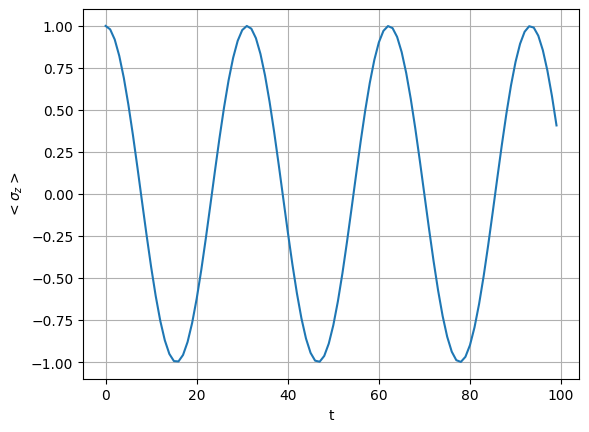

In [111]:
plt.plot(expected_sz)
plt.grid()
plt.xlabel("t")
plt.ylabel("$<\sigma _z>$")

In [112]:
result = mesolve(H, psi0, tlist, [], [sigmax(), sigmay(), sigmaz()])  #Esto guarda los valores esperados de $\sigma _z$, $\sigma _x$ y $\sigma _y$ en result.expect

c:\Users\lande\AppData\Local\Programs\Python\Python312\Lib\site-packages\qutip\solver\solver_base.py:576: FutureWarning: e_ops will be keyword only from qutip 5.3 for all solver
  warnings.warn(


<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:3: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:3: SyntaxWarning: invalid escape sequence '\s'
<>:4: SyntaxWarning: invalid escape sequence '\s'
C:\Users\lande\AppData\Local\Temp\ipykernel_16512\453517881.py:2: SyntaxWarning: invalid escape sequence '\s'
  plt.plot(result.expect[0],label = "<$\sigma_x$>")
C:\Users\lande\AppData\Local\Temp\ipykernel_16512\453517881.py:3: SyntaxWarning: invalid escape sequence '\s'
  plt.plot(result.expect[1],label = "<$\sigma_y$>")
C:\Users\lande\AppData\Local\Temp\ipykernel_16512\453517881.py:4: SyntaxWarning: invalid escape sequence '\s'
  plt.plot(result.expect[2],label = "<$\sigma_z$>",color = "green")


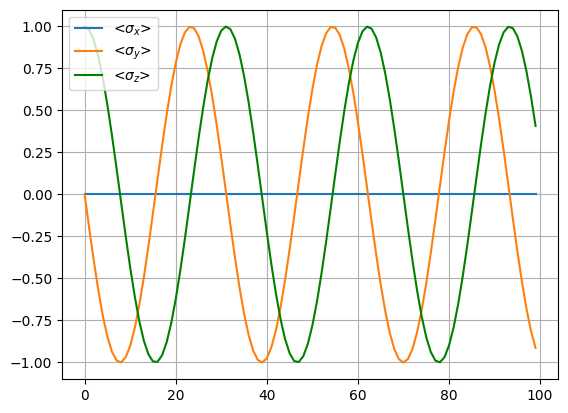

In [115]:
plt.grid()
plt.plot(result.expect[0],label = "<$\sigma_x$>")
plt.plot(result.expect[1],label = "<$\sigma_y$>")
plt.plot(result.expect[2],label = "<$\sigma_z$>",color = "green")
plt.legend(loc =2)